In [1]:
!pip install gtsam

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.1/27.1 MB 13.0 MB/s eta 0:00:00


In [3]:
from pipeline import *
import urllib.request
import importlib.util
import sys

def import_from_url(url, module_name):
    with urllib.request.urlopen(url) as response:
        source = response.read().decode('utf-8')

    spec = importlib.util.spec_from_loader(module_name, loader=None)
    module = importlib.util.module_from_spec(spec)
    exec(compile(source, url, 'exec'), module.__dict__)
    sys.modules[module_name] = module
    return module



## Step 1: Image Loading

Loading all `.tif` images from the `29images` folder and its subfolders. The images are sorted alphabetically to ensure consistent ordering across runs.


In [5]:
import os
import urllib.request

# Create the directory
os.makedirs("29images", exist_ok=True)

base_url = "https://raw.githubusercontent.com/egeozgul/Reconstruction_VisualSLAM/main/input_Images/29images/"

filenames = [
    "ESC.970622_023824.0546.tif", "ESC.970622_023837.0547.tif", "ESC.970622_023850.0548.tif",
    "ESC.970622_023903.0549.tif", "ESC.970622_023916.0550.tif", "ESC.970622_023938.0551.tif",
    "ESC.970622_023951.0552.tif", "ESC.970622_025420.0618.tif", "ESC.970622_025434.0619.tif",
    "ESC.970622_025447.0620.tif", "ESC.970622_025500.0621.tif", "ESC.970622_025513.0622.tif",
    "ESC.970622_025526.0623.tif", "ESC.970622_030140.0651.tif", "ESC.970622_030153.0652.tif",
    "ESC.970622_030206.0653.tif", "ESC.970622_030219.0654.tif", "ESC.970622_030232.0655.tif",
    "ESC.970622_030245.0656.tif", "ESC.970622_030258.0657.tif", "ESC.970622_031543.0715.tif",
    "ESC.970622_031556.0716.tif", "ESC.970622_031609.0717.tif", "ESC.970622_031622.0718.tif",
    "ESC.970622_031635.0719.tif", "ESC.970622_031648.0720.tif", "ESC.970622_031702.0721.tif",
    "ESC.970622_031715.0722.tif"
]

print(f"Downloading {len(filenames)} images...")
for fname in filenames:
    url = base_url + fname
    dest = os.path.join("29images", fname)
    urllib.request.urlretrieve(url, dest)
    #print(f"  Downloaded: {fname}")

print("Done!")

Done!


In [6]:
import os
import glob

# Load images from 266_images folder and its subfolders
image_paths = []

# Get all .tif files from 266_images folder and subfolders
for root, dirs, files in os.walk("29images"):  # fixed: was "266images"
    for file in files:
        if file.lower().endswith('.tif'):
            image_paths.append(os.path.join(root, file))

# Sort the paths to ensure consistent ordering
image_paths.sort()

print(f"Found {len(image_paths)} .tif files in 266_images folder")


Found 28 .tif files in 266_images folder


Loaded 28 valid images


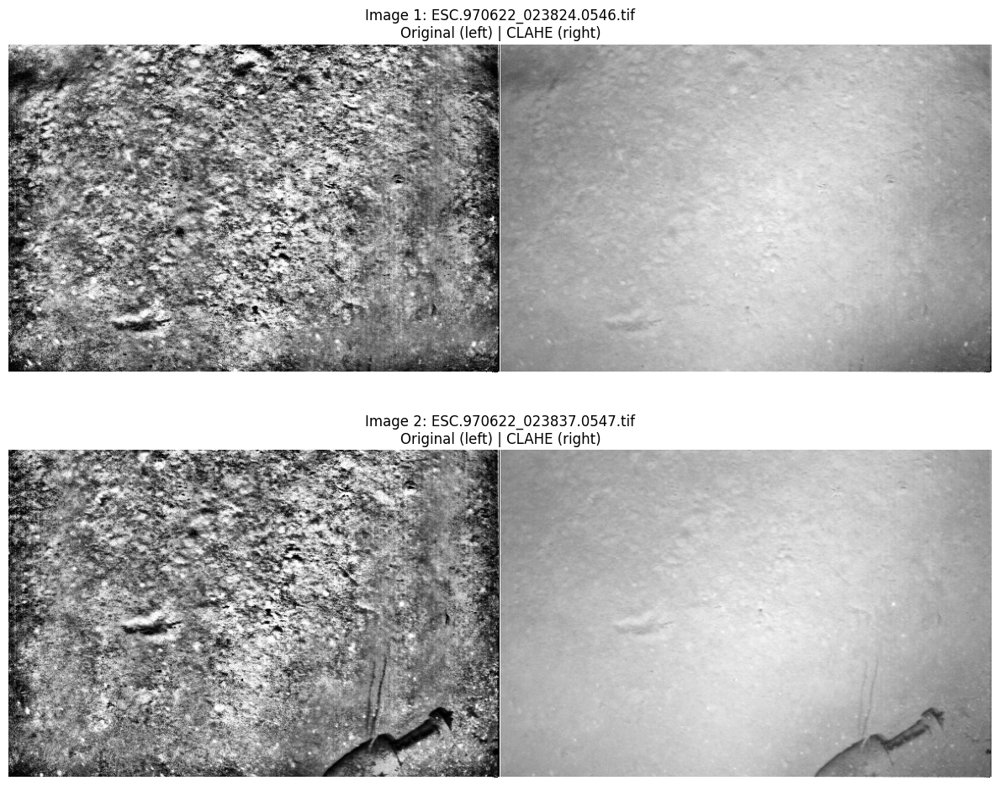

In [39]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os


# Clear and reload fresh
images = []

for idx, img_path in enumerate(image_paths, 1):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is not None:
        folder_name = os.path.basename(os.path.dirname(img_path))
        filename = os.path.basename(img_path)
        images.append((idx, img, f"{folder_name}/{filename}"))

print(f"Loaded {len(images)} valid images")

# Normalize
def normalize(images):
    clahe = cv2.createCLAHE()
    return [(idx, clahe.apply(img), fname) for idx, img, fname in images]

original_images = images[:]     # copy before normalizing
images = normalize(images)

# Plot first 4 only
fig, axes = plt.subplots(2, 1, figsize=(12, 10))
for ax, (idx, orig, fname), (_, norm, _) in zip(axes, images[:2], original_images[:2]):
    both = np.hstack((orig, norm))
    ax.imshow(both, cmap='gray')
    ax.set_title(f'Image {idx}: {os.path.basename(fname)}\nOriginal (left) | CLAHE (right)')
    ax.axis('off')
plt.tight_layout()
plt.show()

## Step 2: Pairwise Matching and MST Construction

This step:
1. Finds feature matches between all pairs of images
2. Computes homographies with quality metrics (covariance)
3. Builds a Minimum Spanning Tree (MST) to select the best connections
4. Visualizes both the full match graph and the optimized MST



In [ ]:
params.SIFT_NFEATURES            = 2000
params.HIST_SIMILARITY_THRESHOLD = 0.0   # disable histogram pre-filter entirely —
                                          # aerial images from same scene are all similar
                                          # so it was filtering out valid overlapping pairs
params.RANSAC_MAX_ITERS          = 500
params.LM_MAX_NFEV               = 200
params.LM_FTOL                   = 1e-5
params.LM_XTOL                   = 1e-5
params.KNN_CANDIDATES            = 30    # was 20; more neighbours = fewer missed connections

print("Params patched:")
print(f"  SIFT_NFEATURES            = {params.SIFT_NFEATURES}")
print(f"  HIST_SIMILARITY_THRESHOLD = {params.HIST_SIMILARITY_THRESHOLD}  (disabled)")
print(f"  KNN_CANDIDATES            = {params.KNN_CANDIDATES}")
print(f"  RANSAC_MAX_ITERS          = {params.RANSAC_MAX_ITERS}")
print(f"  LM_MAX_NFEV               = {params.LM_MAX_NFEV}")
print(f"  LM_FTOL / LM_XTOL        = {params.LM_FTOL}")
# Find pairwise matches and create covariance-weighted MST
# This will show BOTH the full graph and the MST
all_pairwise_data, mst_pairwise_data, mst_graph = find_all_pairwise_matches(images)

# Patch the remote params object with the new attributes added by the optimized pipeline.
# Run this cell immediately after the cell that sets: params = sp.params

if not mst_pairwise_data:
    print("No valid pairs found. Try adjusting the parameters:")
    print(f"  - Decrease MIN_MATCHES (current: {params.MIN_MATCHES})")
    print(f"  - Decrease MIN_INLIER_RATIO (current: {params.MIN_INLIER_RATIO:.1%})")
    print(f"  - Increase SIFT_RATIO_THRESHOLD (current: {params.SIFT_RATIO_THRESHOLD})")
    raise ValueError("No valid image pairs found")


In [9]:
# Analyze homography quality
analyze_homography_quality(mst_pairwise_data)
analyze_rejected_homographies()



HOMOGRAPHY QUALITY ANALYSIS
Quality scores:  mean=21.76  std=21.18  min=1.99  max=109.93
Determinants:  mean=8.42e-01  std=1.99e-01  min=3.82e-01  max=1.34e+00
Condition numbers:  mean=6.11e+04  std=4.10e+04  min=1.18e+04  max=2.03e+05
Reprojection error (px):  mean=1.22  std=0.41  min=0.44  max=2.12

Problematic homographies: none

REJECTED HOMOGRAPHIES ANALYSIS
Rejection criteria:
  1. Poor numerical properties (determinant, condition number)
  2. Unreasonable transformations (extreme scale / translation)
  3. Exploding transformations (corners map to extreme distances)
  4. Low quality scores

This filtering prevents distorted panoramas and improves overall quality.


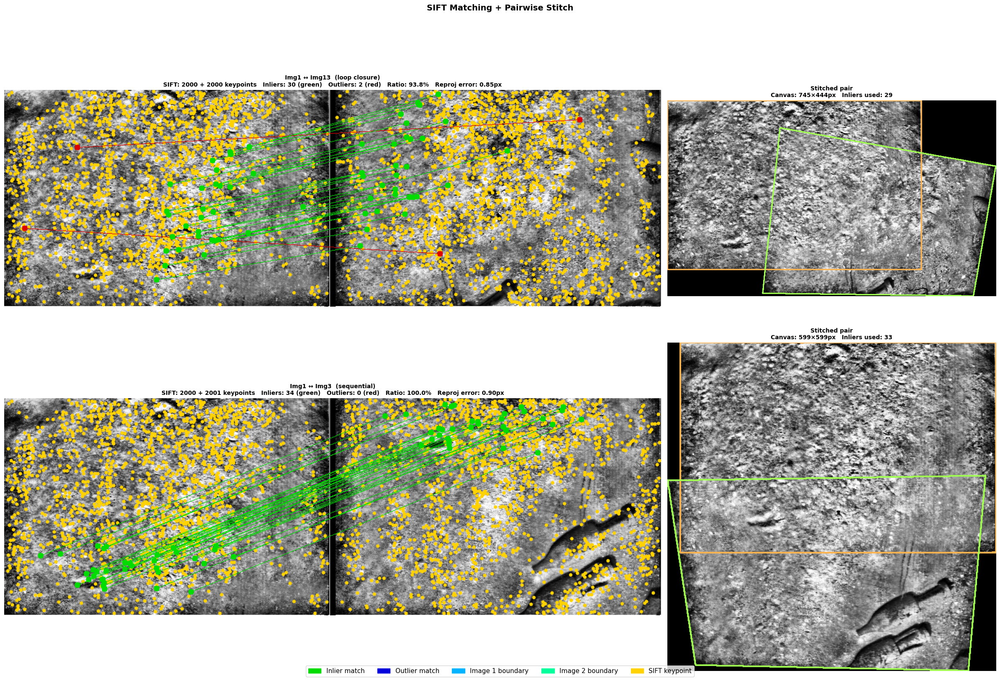

In [35]:
# ── run for ALL pairs ────────────────────────────────────────────────────────
visualize_sift_and_stitch(images, all_pairwise_data,
                          pairs_to_show=2)

In [ ]:
# Build progressive panorama using MST and get transforms
#build_panorama_progressive(images, mst_pairwise_data, mst_graph)


Step 6: Final MST-Based Panorama
Computing the final panorama using all MST edges. This serves as the baseline for comparison with optimized versions.

In [29]:
final_panorama, transforms, ref_idx = build_panorama_final(original_images, mst_pairwise_data, mst_graph)

if final_panorama is not None:
    print(f"MST-based panorama complete! Size: {final_panorama.shape}")
else:
    print("Failed to build MST-based panorama")
    raise ValueError("Panorama construction failed")


MST-based panorama complete! Size: (1071, 1049)


## Step 7: 2D Position Graph

Extracting and visualizing the 2D positions of each image based on the homography transformations. This graph shows the spatial layout of images in the panorama coordinate system.



Computing absolute image positions...


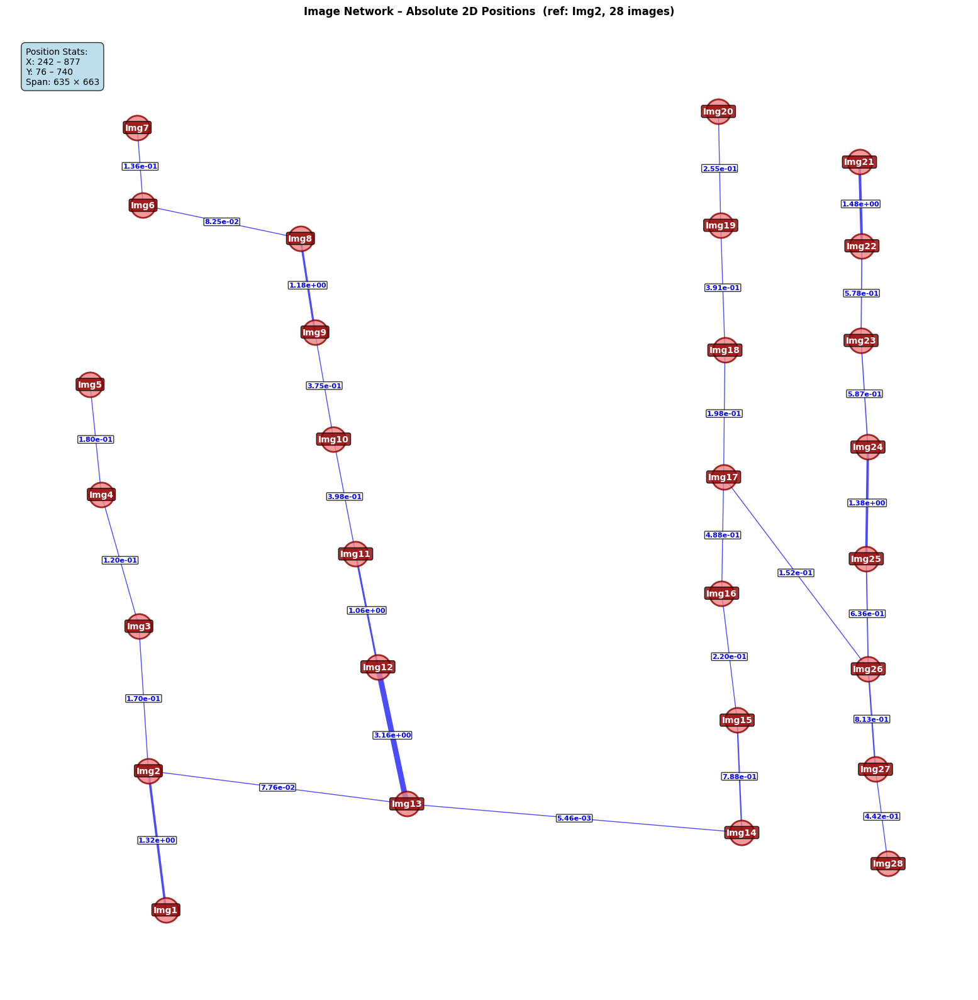


ABSOLUTE IMAGE POSITIONS
Reference: Img2
  Img 1: (   301.9,     76.5)
  Img 3: (   280.4,    312.2)
  Img 4: (   250.6,    421.6)
  Img 5: (   241.6,    513.0)
  Img 6: (   283.8,    661.9)
  Img 7: (   279.1,    726.5)
  Img 8: (   409.0,    634.4)
  Img 9: (   420.5,    556.5)
  Img10: (   435.4,    467.6)
  Img11: (   452.9,    372.2)
  Img12: (   470.6,    278.4)
  Img13: (   493.6,    164.5)
  Img14: (   760.2,    140.7)
  Img15: (   756.5,    234.1)
  Img16: (   744.2,    339.6)
  Img17: (   745.8,    436.1)
  Img18: (   746.8,    541.5)
  Img19: (   743.4,    645.3)
  Img20: (   741.7,    739.9)
  Img21: (   853.9,    697.8)
  Img22: (   855.8,    628.2)
  Img23: (   855.1,    549.6)
  Img24: (   860.6,    461.0)
  Img25: (   859.3,    368.2)
  Img26: (   860.9,    276.7)
  Img27: (   866.6,    193.3)
  Img28: (   876.6,    114.9)


In [13]:
# Show position graph with absolute 2D positions
if transforms and ref_idx is not None:
    initial_positions = show_position_graph(images, mst_pairwise_data, mst_graph, transforms, ref_idx)
else:
    raise ValueError("Failed to compute transforms")



Computing absolute image positions...


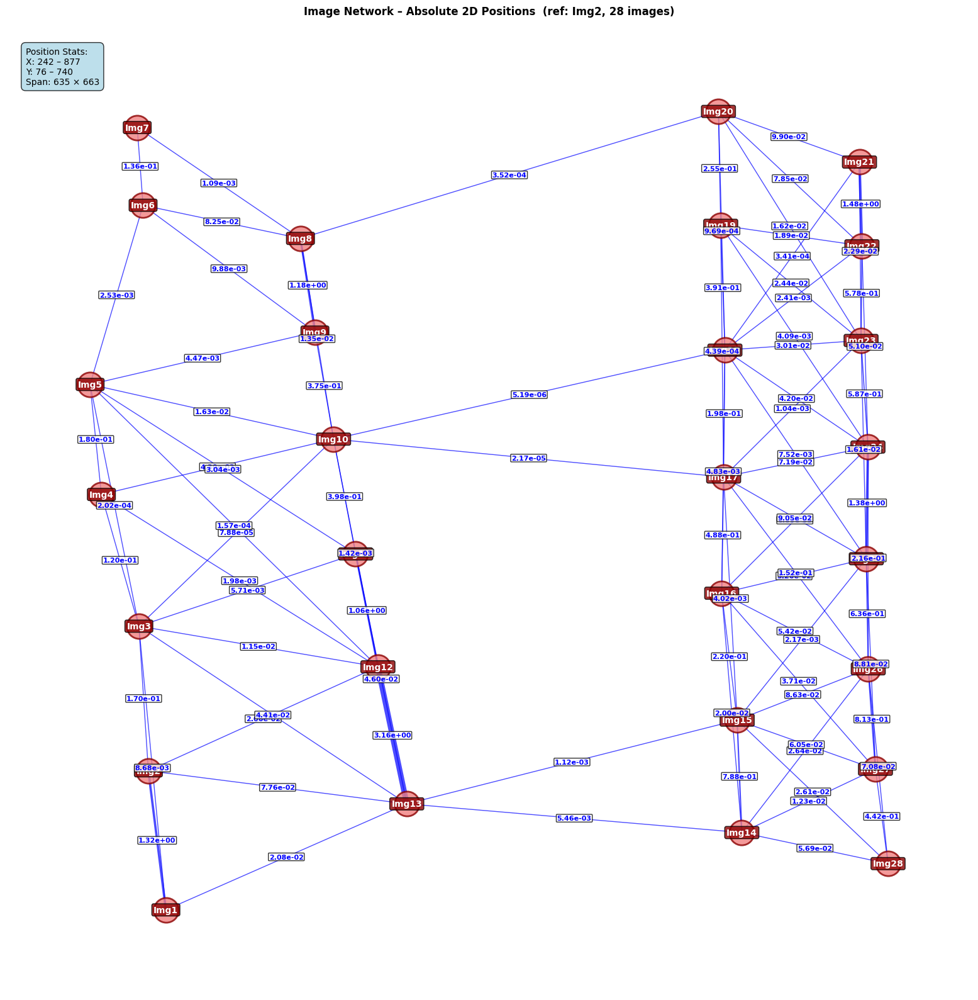


ABSOLUTE IMAGE POSITIONS
Reference: Img2
  Img 1: (   301.9,     76.5)
  Img 3: (   280.4,    312.2)
  Img 4: (   250.6,    421.6)
  Img 5: (   241.6,    513.0)
  Img 6: (   283.8,    661.9)
  Img 7: (   279.1,    726.5)
  Img 8: (   409.0,    634.4)
  Img 9: (   420.5,    556.5)
  Img10: (   435.4,    467.6)
  Img11: (   452.9,    372.2)
  Img12: (   470.6,    278.4)
  Img13: (   493.6,    164.5)
  Img14: (   760.2,    140.7)
  Img15: (   756.5,    234.1)
  Img16: (   744.2,    339.6)
  Img17: (   745.8,    436.1)
  Img18: (   746.8,    541.5)
  Img19: (   743.4,    645.3)
  Img20: (   741.7,    739.9)
  Img21: (   853.9,    697.8)
  Img22: (   855.8,    628.2)
  Img23: (   855.1,    549.6)
  Img24: (   860.6,    461.0)
  Img25: (   859.3,    368.2)
  Img26: (   860.9,    276.7)
  Img27: (   866.6,    193.3)
  Img28: (   876.6,    114.9)


In [14]:
# Build full graph from all valid pairs (includes loop closures)
full_viz_graph = nx.Graph()
for (i, j) in mst_pairwise_data:
    full_viz_graph.add_edge(i, j)

# Show position graph with absolute 2D positions using FULL graph
if transforms and ref_idx is not None:
    initial_positions = show_position_graph(
        images, mst_pairwise_data, full_viz_graph, transforms, ref_idx)
else:
    raise ValueError("Failed to compute transforms")

## Step 8: GTSAM 2D Position Optimization

Using GTSAM (Georgia Tech Smoothing and Mapping) to optimize the 2D positions of images. This optimization:
- Uses covariance information from homography estimation
- Minimizes position inconsistencies
- Produces a globally consistent layout


In [15]:
sequential = sum(1 for (i,j) in all_pairwise_data if abs(i-j) <= 2)
loop_closures = sum(1 for (i,j) in all_pairwise_data if abs(i-j) > 2)
print(f"Edges passed to GTSAM — sequential: {sequential}, loop closures: {loop_closures}")

Edges passed to GTSAM — sequential: 46, loop closures: 41


In [17]:
if initial_positions and len(initial_positions) > 1:
    print("\n" + "="*80)
    print("GTSAM 2D POSITION OPTIMIZATION")
    print("="*80)

    # Optimize 2D positions using GTSAM with covariance information
    #optimized_positions = gtsam_optimize_2d_positions(images, mst_pairwise_data, initial_positions, ref_idx)
    # Step 8 — corrected
    optimized_positions = gtsam_optimize_2d_positions(images, all_pairwise_data, initial_positions, ref_idx)
else:
    raise ValueError("Insufficient position data for optimization")



GTSAM 2D POSITION OPTIMIZATION
  Node priors:
    idx= 0  loop_connections=1  sigma=150
    idx= 2  loop_connections=4  sigma=500
    idx=12  loop_connections=3  sigma=500
    idx= 3  loop_connections=2  sigma=300
    idx=11  loop_connections=4  sigma=500
    idx=13  loop_connections=3  sigma=500
    idx= 4  loop_connections=4  sigma=500
    idx=10  loop_connections=2  sigma=300
    idx=14  loop_connections=4  sigma=500
    idx= 9  loop_connections=5  sigma=500
    idx=15  loop_connections=4  sigma=500
    idx= 8  loop_connections=2  sigma=300
    idx=16  loop_connections=5  sigma=500
    idx= 7  loop_connections=1  sigma=150
    idx=17  loop_connections=6  sigma=500
    idx=25  loop_connections=4  sigma=500
    idx= 5  loop_connections=1  sigma=150
    idx=18  loop_connections=3  sigma=500
    idx=26  loop_connections=3  sigma=500
    idx=24  loop_connections=4  sigma=500
    idx= 6  loop_connections=0  sigma=80
    idx=19  loop_connections=2  sigma=300
    idx=27  loop_connections=2

In [18]:
sequential = sum(1 for (i,j) in all_pairwise_data if abs(i-j) <= 2)
loop_closures = sum(1 for (i,j) in all_pairwise_data if abs(i-j) > 2)
print(f"all_pairwise_data — sequential: {sequential}, loop closures: {loop_closures}")

all_pairwise_data — sequential: 46, loop closures: 41


## Step 9: Original vs. Optimized Positions

Comparing the initial positions (from sequential homographies) with GTSAM-optimized positions. The optimization typically reduces drift and improves global consistency.



POSITION COMPARISON: ORIGINAL vs GTSAM-OPTIMIZED


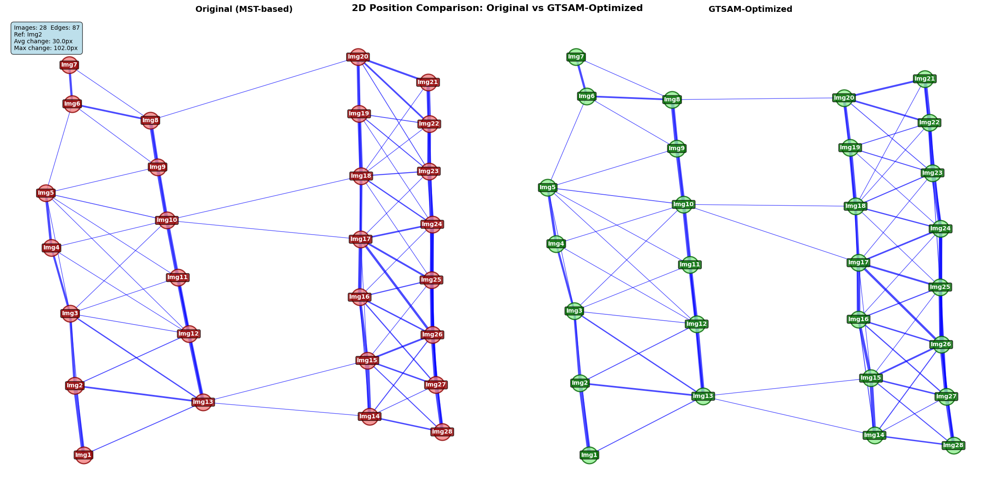


Image    Original (x,y)         Optimized (x,y)        Δ (px)
----------------------------------------------------------------------
Img1     (  301.9,   76.5)    (  302.4,   76.8)         0.6
Img2     (  288.0,  192.0)    (  288.0,  192.0)         0.0
Img3     (  280.4,  312.2)    (  279.2,  307.7)         4.7
Img4     (  250.6,  421.6)    (  251.3,  415.4)         6.3
Img5     (  241.6,  513.0)    (  238.3,  505.4)         8.3
Img6     (  283.8,  661.9)    (  298.4,  651.9)        17.7
Img7     (  279.1,  726.5)    (  282.0,  714.7)        12.2
Img8     (  409.0,  634.4)    (  429.8,  646.4)        24.0
Img9     (  420.5,  556.5)    (  437.1,  568.1)        20.2
Img10    (  435.4,  467.6)    (  447.6,  478.4)        16.3
Img11    (  452.9,  372.2)    (  457.2,  381.7)        10.4
Img12    (  470.6,  278.4)    (  467.6,  286.7)         8.8
Img13    (  493.6,  164.5)    (  477.7,  171.0)        17.1
Img14    (  760.2,  140.7)    (  741.5,  108.2)        37.5
Img15    (  756.5,  234.1)

{1: array([288.00000013, 192.00000055]),
 0: array([302.40083171,  76.79552866]),
 2: array([279.15310911, 307.65796198]),
 12: array([477.74398719, 170.95017202]),
 3: array([251.32624579, 415.36411101]),
 11: array([467.62145589, 286.69785035]),
 13: array([741.54827076, 108.24230013]),
 4: array([238.26239065, 505.40113373]),
 10: array([457.22079651, 381.68656639]),
 14: array([736.19748791, 200.00010485]),
 9: array([447.58878871, 478.44389852]),
 15: array([716.99702441, 294.40095515]),
 8: array([437.13754353, 568.13408075]),
 16: array([716.79778556, 385.01662195]),
 7: array([429.81762861, 646.41803111]),
 17: array([712.39339914, 475.52155026]),
 25: array([844.26596298, 253.81301362]),
 5: array([298.41816878, 651.88831515]),
 18: array([704.14642665, 569.37732951]),
 26: array([852.26867072, 170.42357685]),
 24: array([842.84205413, 345.98665384]),
 6: array([281.98552996, 714.68563731]),
 19: array([694.58305454, 649.35443165]),
 27: array([863.29469325,  91.88176209]),
 2

In [19]:
# Step 9 — also pass full_viz_graph
show_position_comparison(images, mst_pairwise_data,
                         initial_positions, optimized_positions, ref_idx)
# (this one builds its own graph internally from pairwise_data keys, so it's already fine)


## FULL PANORAMA BUILDUP - Normalized images

Progressive build starting from Image 1
Traversal order: [1, 2, 3, 13, 4, 12, 14, 5, 11, 15, 10, 16, 9, 17, 8, 18, 26, 6, 19, 27, 25, 7, 20, 28, 24, 23, 22, 21]


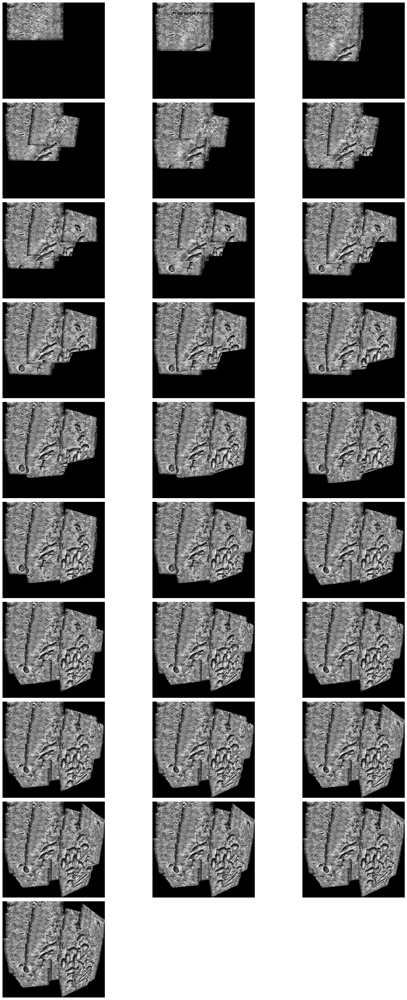

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [20]:

# Step 4 — progressive panorama also uses mst_graph, replace with:
build_panorama_progressive(images, mst_pairwise_data, full_viz_graph)

## Step 10: Updating Homographies with Optimized Positions

Recomputing homographies based on the GTSAM-optimized 2D positions. This creates new transformations that are globally consistent while maintaining local image quality.


In [21]:
print("\n" + "="*80)
print("UPDATING HOMOGRAPHIES WITH GTSAM-OPTIMIZED POSITIONS")
print("="*80)


updated_transforms = update_homographies_with_optimized_positions(
    images, transforms, initial_positions, optimized_positions, ref_idx)

print("")

# ✅ Call it here — transforms comes from build_panorama_final above
updated_transforms = update_transforms_with_gtsam(
    transforms,           # original homographies from build_panorama_final
    initial_positions,    # positions before GTSAM
    optimized_positions,  # positions after GTSAM
    ref_idx               # reference image (17)
)


UPDATING HOMOGRAPHIES WITH GTSAM-OPTIMIZED POSITIONS

UPDATING HOMOGRAPHIES WITH GTSAM POSITIONS
Img 1: Δ=(    0.5,    0.3)
Img 3: Δ=(   -1.3,   -4.5)
Img13: Δ=(  -15.9,    6.4)
Img 4: Δ=(    0.7,   -6.3)
Img12: Δ=(   -3.0,    8.3)
Img14: Δ=(  -18.7,  -32.5)
Img 5: Δ=(   -3.3,   -7.6)
Img11: Δ=(    4.3,    9.5)
Img15: Δ=(  -20.3,  -34.1)
Img10: Δ=(   12.2,   10.8)
Img16: Δ=(  -27.2,  -45.2)
Img 9: Δ=(   16.6,   11.6)
Img17: Δ=(  -29.0,  -51.1)
Img 8: Δ=(   20.8,   12.1)
Img18: Δ=(  -34.4,  -66.0)
Img26: Δ=(  -16.6,  -22.9)
Img 6: Δ=(   14.6,  -10.0)
Img19: Δ=(  -39.3,  -75.9)
Img27: Δ=(  -14.3,  -22.9)
Img25: Δ=(  -16.5,  -22.2)
Img 7: Δ=(    2.9,  -11.8)
Img20: Δ=(  -47.1,  -90.5)
Img28: Δ=(  -13.3,  -23.0)
Img24: Δ=(  -17.2,  -21.7)
Img23: Δ=(  -24.1,  -20.6)
Img22: Δ=(  -29.6,  -18.8)
Img21: Δ=(  -34.8,  -18.0)
Updated 28 homographies.

GTSAM corrections applied: 27/27 images
Clamped (correction too large): 0 images


## Step 11: Building Panorama with Position-Optimized Homographies

Creating a new panorama using the updated homographies. This panorama should have better global alignment than the original MST-based version.


In [ ]:
gtsam_panorama = build_panorama_with_updated_homographies(
    images, updated_transforms, "GTSAM-Optimized Panorama")

if gtsam_panorama is None:
    raise ValueError("GTSAM panorama construction failed")
print(f"GTSAM panorama complete: {gtsam_panorama.shape}")


## FULL PANORAMA - Normalized Images

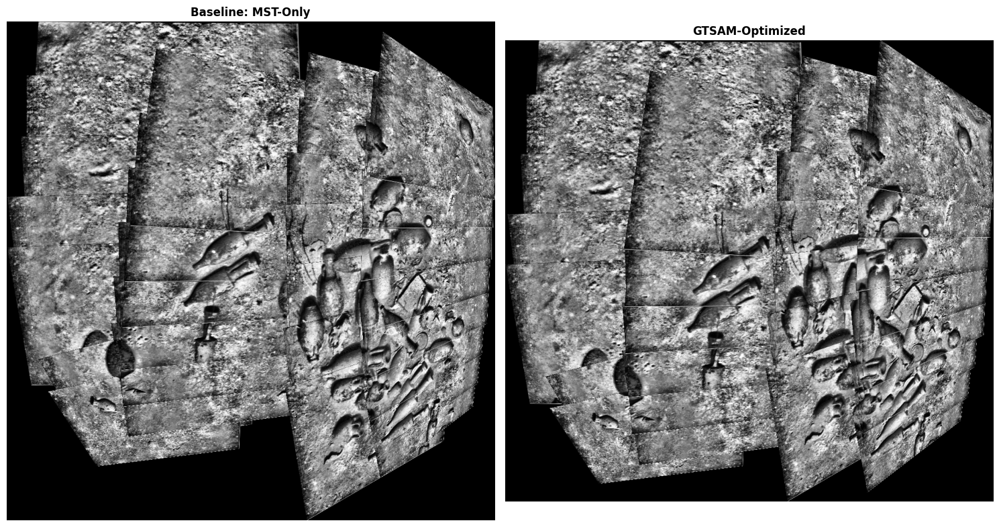

In [24]:

# Side-by-side comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
ax1.imshow(final_panorama, cmap='gray')
ax1.set_title("Baseline: MST-Only", fontsize=12, fontweight='bold')
ax1.axis('off')
ax2.imshow(gtsam_panorama, cmap='gray')
ax2.set_title("GTSAM-Optimized", fontsize=12, fontweight='bold')
ax2.axis('off')
plt.tight_layout(); plt.show()

In [ ]:
gtsam_panorama = build_panorama_with_updated_homographies(
    original_images, updated_transforms, "GTSAM-Optimized Panorama")


## FULL PANORAMA - Original Images

GTSAM panorama complete: (982, 1039)


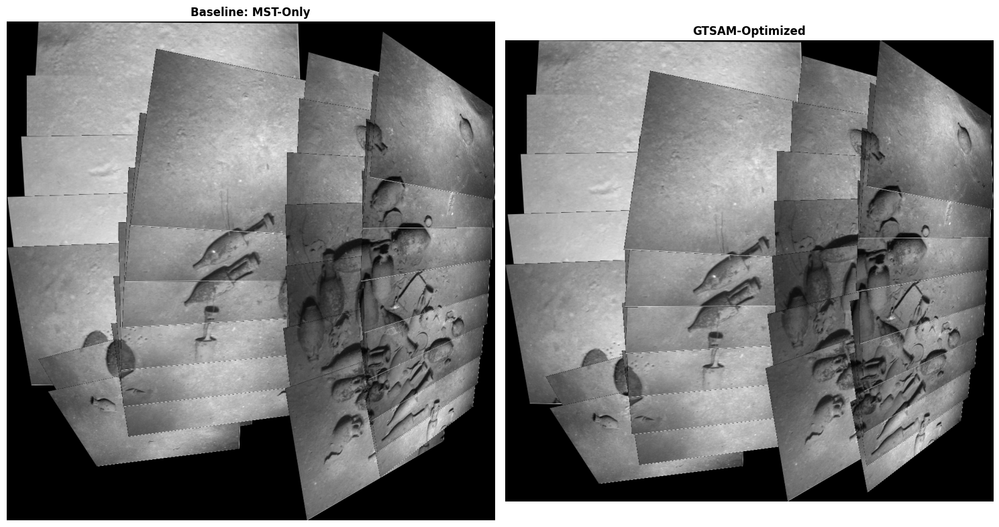

In [32]:

if gtsam_panorama is None:
    raise ValueError("GTSAM panorama construction failed")
print(f"GTSAM panorama complete: {gtsam_panorama.shape}")

# Side-by-side comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
ax1.imshow(final_panorama, cmap='gray')
ax1.set_title("Baseline: MST-Only", fontsize=12, fontweight='bold')
ax1.axis('off')
ax2.imshow(gtsam_panorama, cmap='gray')
ax2.set_title("GTSAM-Optimized", fontsize=12, fontweight='bold')
ax2.axis('off')
plt.tight_layout(); plt.show()